### snb_thesis_vascular_object_chapter3

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm

In [3]:
import matplotlib
import seaborn as sns
from matplotlib import colors
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

In [4]:
sc.settings.set_figure_params(dpi=300,fontsize=15)

In [5]:
adata = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Endothelial_datasets/data_analyzed/sanger_datasets/adult18_vas_20230622_SNB.h5ad')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


### cell state enrichment calculation

In [37]:
df = adata.obs[['ann_merged_final','organ_uni']]

In [38]:
count_table = pd.pivot_table(df, index='ann_merged_final', columns='organ_uni', aggfunc=len, fill_value=0)
count_table#.to_csv("")
# contingency_table = pd.crosstab(df['A'], df['B'])

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0,0,0,2,0,0,109,0,14,0,0,0,0,1,2,1,1,0
art_ec_1,9,9,0,189,19,125,18,28,15,28,35,49,24,253,20,76,18,35
art_ec_2,159,14,6,1788,85,58,76,18,30,185,516,49,17,114,221,238,79,47
kidney_art_ec,0,0,1,3,193,0,1,0,6,1,2,18,2,0,6,1,0,3
spleen_art_ec,0,0,0,0,1,0,0,0,1,0,0,0,0,0,404,0,0,0
pul_art_ec,0,0,0,9,4,1,1,6,689,1,0,2,0,2,7,0,8,5
ven_ec_1,103,136,37,825,47,343,481,8,997,1244,175,922,106,680,4,883,989,465
ven_ec_2,540,1,0,29,0,1,2,0,3,5,2092,5,0,0,0,9,9,1
pul_ven_ec,0,5,0,85,26,1,5,81,1018,9,2,7,5,3,0,41,5,2


In [39]:
from scipy.stats import chi2_contingency
chi2, p_value, dof, expected = chi2_contingency(count_table)

enrichment_table = pd.DataFrame(count_table.values / expected, index=count_table.index, columns=count_table.columns)

# print(f"Chi-square test statistic: {chi2:.4f}")
# print(f"P-value: {p_value:.4f}")
# print(f"Degrees of freedom: {dof}")
# print("Expected frequencies:")
# print(expected)
enrichment_table

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0.000000,0.000000,0.000000,0.067455,0.000000,0.000000,24.757030,0.000000,0.887477,0.000000,0.000000,0.000000,0.000000,0.292155,0.245768,0.191934,0.269122,0.000000
art_ec_1,0.258060,0.668222,0.000000,0.872296,0.790615,7.975503,0.559454,1.013098,0.130119,0.468731,0.293301,2.760566,1.076283,10.114709,0.336314,1.996118,0.662891,0.609173
art_ec_2,1.170570,0.266887,0.035084,2.118807,0.908139,0.950163,0.606495,0.167220,0.066818,0.795169,1.110240,0.708794,0.195743,1.170199,0.954178,1.604987,0.746997,0.210035
kidney_art_ec,0.000000,0.000000,0.091288,0.055501,32.191710,0.000000,0.124585,0.000000,0.208629,0.067103,0.067182,4.064900,0.359518,0.000000,0.404429,0.105280,0.000000,0.209300
spleen_art_ec,0.000000,0.000000,0.000000,0.000000,0.097366,0.000000,0.000000,0.000000,0.020298,0.000000,0.000000,0.000000,0.000000,0.000000,15.896236,0.000000,0.000000,0.000000
pul_art_ec,0.000000,0.000000,0.000000,0.053688,0.215133,0.082468,0.040172,0.280596,7.725099,0.021637,0.000000,0.145636,0.000000,0.103347,0.152142,0.000000,0.380799,0.112481
ven_ec_1,0.332231,1.135902,0.094790,0.428331,0.220005,2.461876,1.681748,0.032562,0.972899,2.342663,0.164971,5.843283,0.534743,3.058199,0.007567,2.608899,4.097226,0.910437
ven_ec_2,5.453996,0.026153,0.000000,0.047146,0.000000,0.022475,0.021896,0.000000,0.009167,0.029483,6.175181,0.099224,0.000000,0.000000,0.000000,0.083264,0.116749,0.006131
pul_ven_ec,0.000000,0.272334,0.000000,0.287789,0.793668,0.046806,0.114003,2.149970,6.478138,0.110525,0.012295,0.289304,0.164490,0.087985,0.000000,0.789969,0.135081,0.025536


In [40]:
log1p_enrichment_table = np.log1p(enrichment_table)
log1p_enrichment_table

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0.000000,0.000000,0.000000,0.065277,0.000000,0.000000,3.248708,0.000000,0.635241,0.000000,0.000000,0.000000,0.000000,0.256311,0.219752,0.175578,0.238326,0.000000
art_ec_1,0.229571,0.511758,0.000000,0.627165,0.582559,2.194499,0.444336,0.699675,0.122323,0.384399,0.257198,1.324569,0.730579,2.408269,0.289915,1.097317,0.508558,0.475721
art_ec_2,0.774990,0.236563,0.034483,1.137451,0.646128,0.667913,0.474055,0.154625,0.064680,0.585099,0.746802,0.535788,0.178768,0.774819,0.669970,0.957428,0.557898,0.190650
kidney_art_ec,0.000000,0.000000,0.087359,0.054015,3.502300,0.000000,0.117414,0.000000,0.189487,0.064947,0.065021,1.622334,0.307130,0.000000,0.339631,0.100099,0.000000,0.190042
spleen_art_ec,0.000000,0.000000,0.000000,0.000000,0.092913,0.000000,0.000000,0.000000,0.020094,0.000000,0.000000,0.000000,0.000000,0.000000,2.827091,0.000000,0.000000,0.000000
pul_art_ec,0.000000,0.000000,0.000000,0.052297,0.194854,0.079243,0.039386,0.247325,2.166204,0.021406,0.000000,0.135960,0.000000,0.098349,0.141623,0.000000,0.322662,0.106593
ven_ec_1,0.286855,0.758889,0.090563,0.356507,0.198855,1.241811,0.986469,0.032043,0.679504,1.206768,0.152696,1.923268,0.428363,1.400739,0.007538,1.283403,1.628697,0.647332
ven_ec_2,1.864699,0.025817,0.000000,0.046068,0.000000,0.022226,0.021660,0.000000,0.009125,0.029057,1.970628,0.094604,0.000000,0.000000,0.000000,0.079979,0.110422,0.006112
pul_ven_ec,0.000000,0.240853,0.000000,0.252927,0.584262,0.045744,0.107960,1.147393,2.011984,0.104833,0.012220,0.254102,0.152283,0.084327,0.000000,0.582199,0.126704,0.025216


### arterial_ec

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


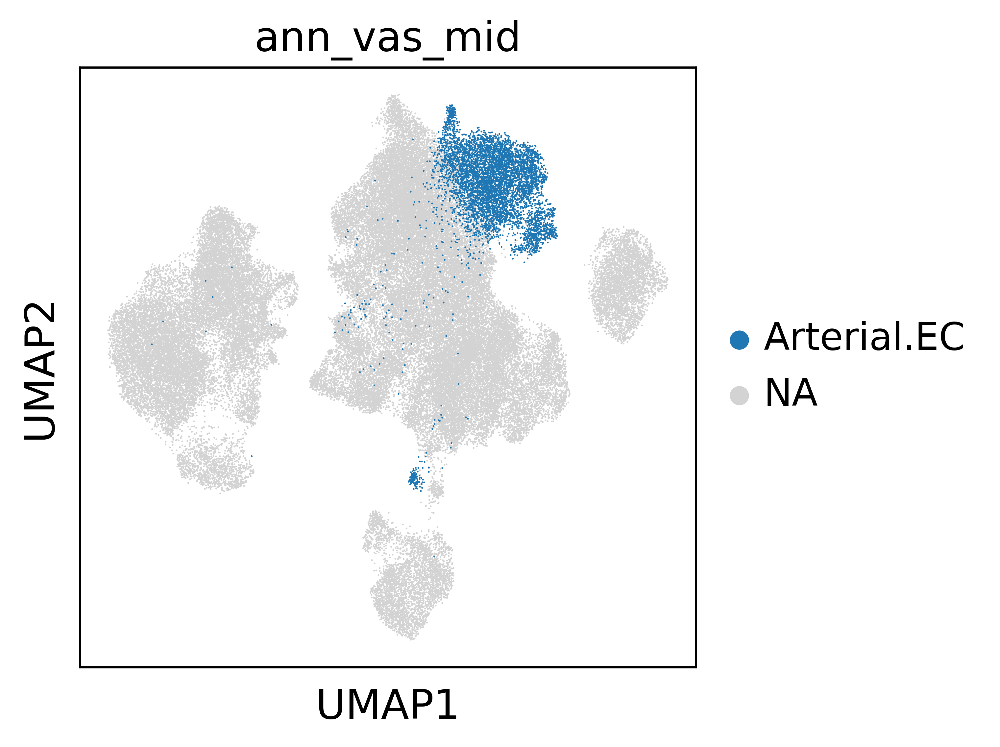

In [7]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["Arterial.EC"], frameon = True)

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


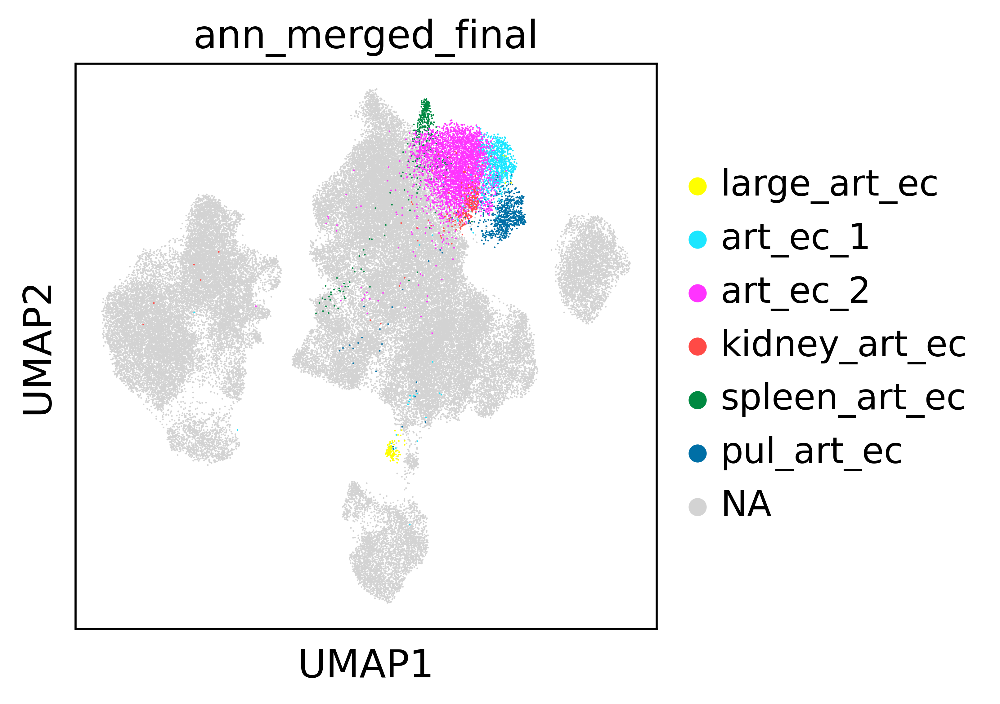

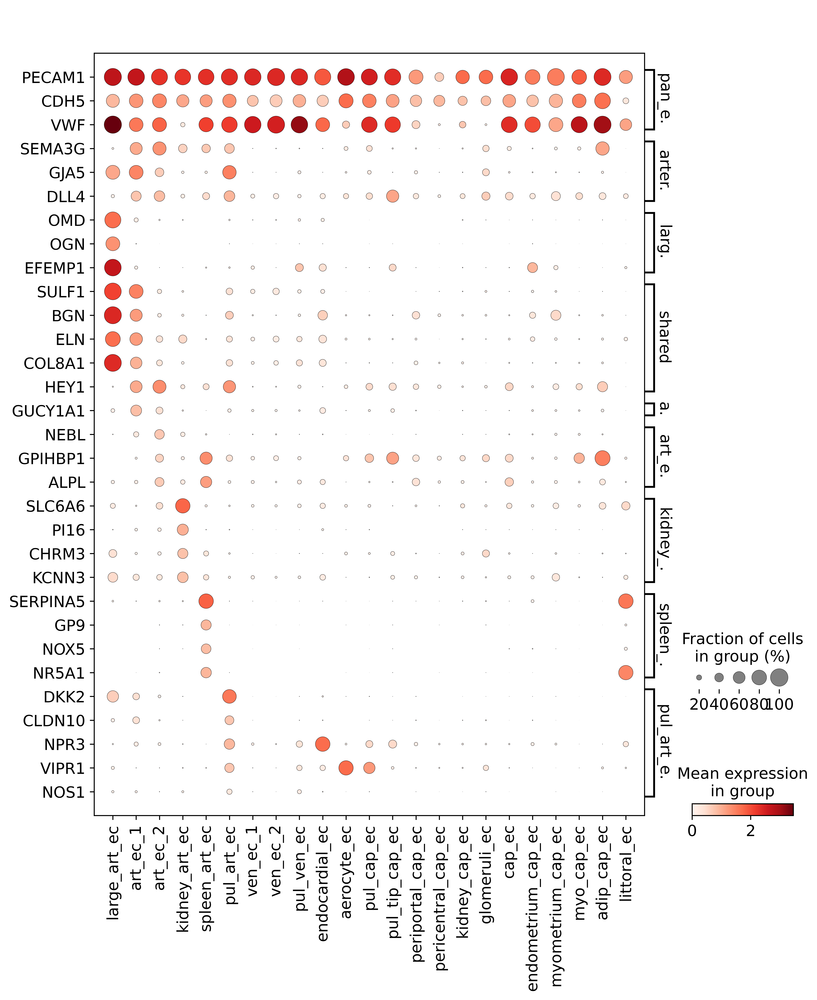

In [10]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ["large_art_ec","art_ec_1","art_ec_2","pul_art_ec","kidney_art_ec","spleen_art_ec"])

art_markers = {
    'pan_ec': ["PECAM1","CDH5","VWF"],
    'arterial_ec': ["SEMA3G","GJA5","DLL4"],
    'large_art_ec': ["OMD","OGN","EFEMP1"],
    'shared': ["SULF1","BGN","ELN","COL8A1","HEY1"],
    'art_ec_1': ["GUCY1A1"],
    'art_ec_2': ["NEBL","GPIHBP1","ALPL"],
    'kidney_art_ec': ["SLC6A6","PI16","CHRM3","KCNN3"],
    'spleen_art_ec': ["SERPINA5","GP9","NOX5","NR5A1"],
    'pul_art_ec': ["DKK2","CLDN10","NPR3","VIPR1","NOS1"]
}

sc.pl.dotplot(adata_ec, art_markers, "ann_merged_final", swap_axes = True, color_map = 'Reds')

In [74]:
df6 = log1p_enrichment_table.loc[["large_art_ec","art_ec_1","art_ec_2","kidney_art_ec","spleen_art_ec","pul_art_ec"]]

In [75]:
df6

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
large_art_ec,0.000000,0.000000,0.000000,0.065277,0.000000,0.000000,3.248708,0.000000,0.635241,0.000000,0.000000,0.000000,0.000000,0.256311,0.219752,0.175578,0.238326,0.000000
art_ec_1,0.229571,0.511758,0.000000,0.627165,0.582559,2.194499,0.444336,0.699675,0.122323,0.384399,0.257198,1.324569,0.730579,2.408269,0.289915,1.097317,0.508558,0.475721
art_ec_2,0.774990,0.236563,0.034483,1.137451,0.646128,0.667913,0.474055,0.154625,0.064680,0.585099,0.746802,0.535788,0.178768,0.774819,0.669970,0.957428,0.557898,0.190650
kidney_art_ec,0.000000,0.000000,0.087359,0.054015,3.502300,0.000000,0.117414,0.000000,0.189487,0.064947,0.065021,1.622334,0.307130,0.000000,0.339631,0.100099,0.000000,0.190042
spleen_art_ec,0.000000,0.000000,0.000000,0.000000,0.092913,0.000000,0.000000,0.000000,0.020094,0.000000,0.000000,0.000000,0.000000,0.000000,2.827091,0.000000,0.000000,0.000000
pul_art_ec,0.000000,0.000000,0.000000,0.052297,0.194854,0.079243,0.039386,0.247325,2.166204,0.021406,0.000000,0.135960,0.000000,0.098349,0.141623,0.000000,0.322662,0.106593


In [76]:
df7 = df6.transpose()
df7

ann_merged_final,large_art_ec,art_ec_1,art_ec_2,kidney_art_ec,spleen_art_ec,pul_art_ec
organ_uni,,,,,,
adipose_tissue,0.000000,0.229571,0.774990,0.000000,0.000000,0.000000
bladder,0.000000,0.511758,0.236563,0.000000,0.000000,0.000000
decidua,0.000000,0.000000,0.034483,0.087359,0.000000,0.000000
heart,0.065277,0.627165,1.137451,0.054015,0.000000,0.052297
kidney,0.000000,0.582559,0.646128,3.502300,0.092913,0.194854
large_intestine,0.000000,2.194499,0.667913,0.000000,0.000000,0.079243
large_vessels,3.248708,0.444336,0.474055,0.117414,0.000000,0.039386
liver,0.000000,0.699675,0.154625,0.000000,0.000000,0.247325
lung,0.635241,0.122323,0.064680,0.189487,0.020094,2.166204


In [ ]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (6,6)}):
    sns.heatmap(df7,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 1})
    

    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')

### venous_ec

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


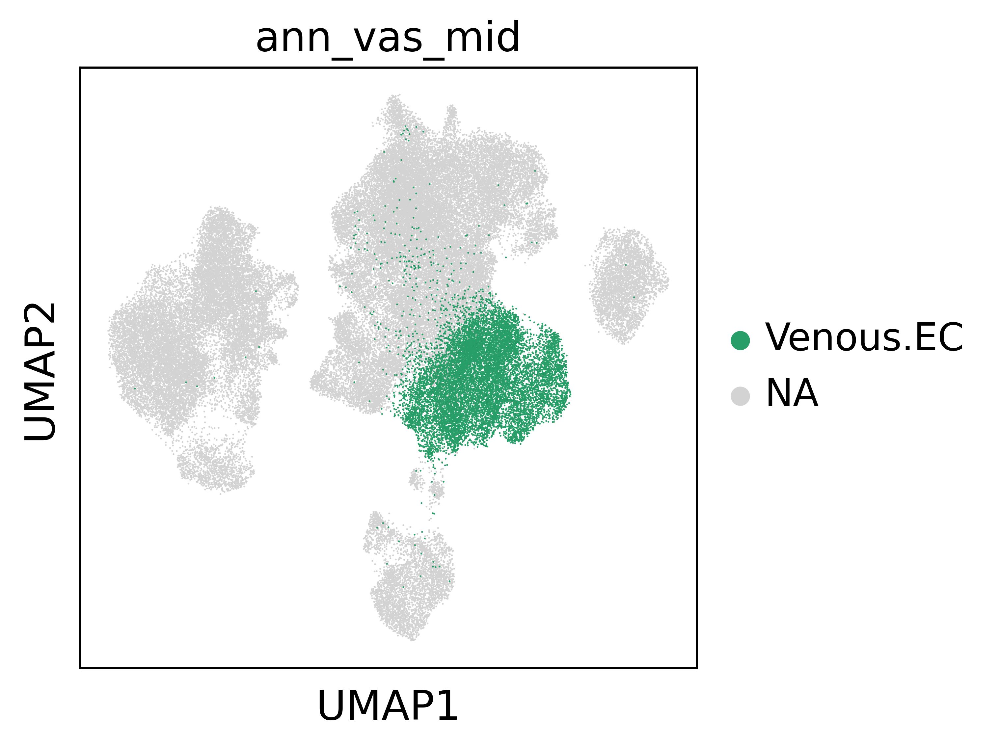

In [8]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["Venous.EC"], frameon = True)

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


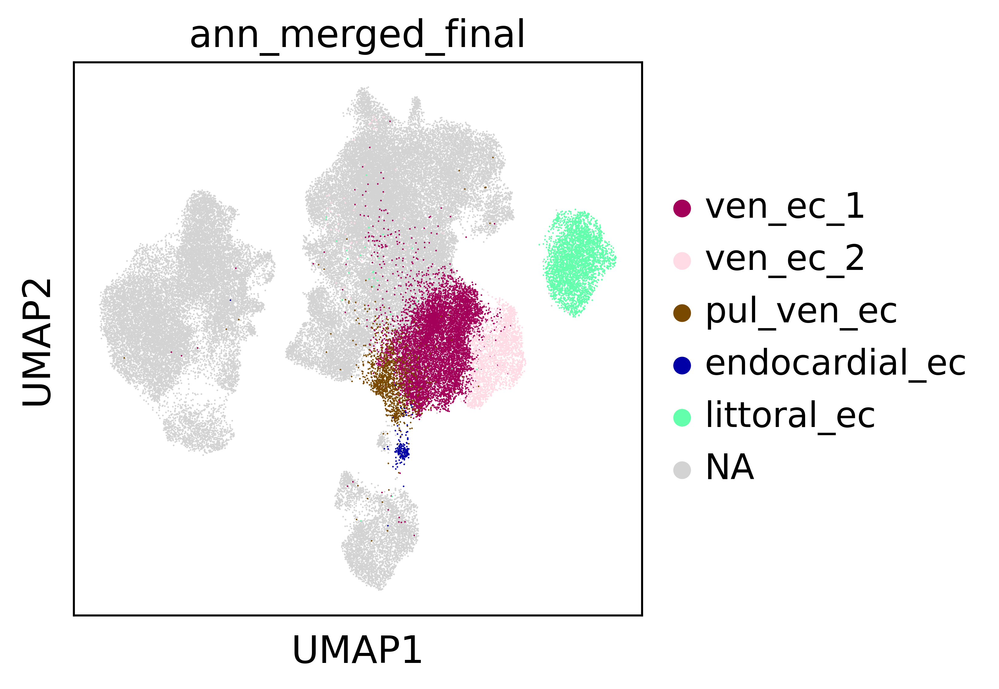

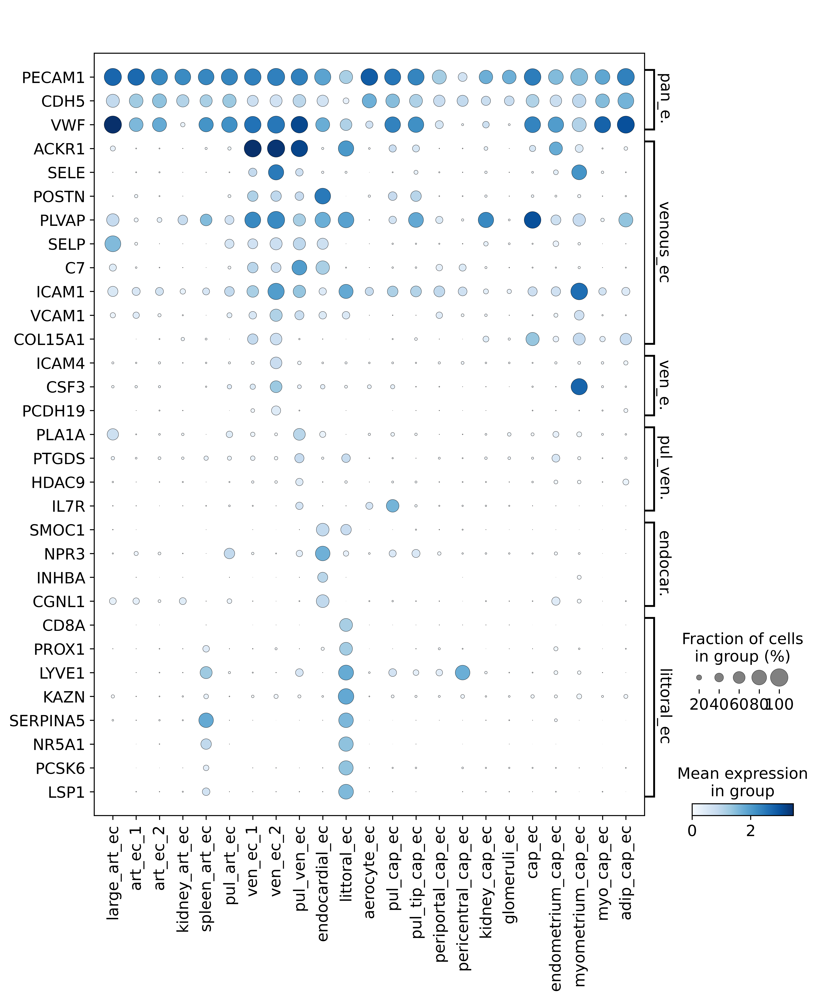

In [15]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ["ven_ec_1","ven_ec_2","pul_ven_ec","littoral_ec","endocardial_ec"])

art_markers = {
    'pan_ec': ["PECAM1","CDH5","VWF"],
    'venous_ec': ["ACKR1","SELE","POSTN","PLVAP","SELP","C7","ICAM1","VCAM1","COL15A1"],
    'ven_ec_2': ["ICAM4","CSF3","PCDH19"],
    'pul_ven_ec': ["PLA1A","PTGDS","HDAC9","IL7R"],
    'endocardial_ec': ["SMOC1","NPR3","INHBA","CGNL1"],
    'littoral_ec': ["CD8A","PROX1","LYVE1","KAZN","SERPINA5","NR5A1","PCSK6","LSP1"]
}

sc.pl.dotplot(adata_ec, art_markers, "ann_merged_final", swap_axes = True, color_map = 'Blues')

In [17]:
df6 = log1p_enrichment_table.loc[["ven_ec_1","ven_ec_2","pul_ven_ec","endocardial_ec","littoral_ec",]]

In [18]:
df6

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
ven_ec_1,0.286855,0.758889,0.090563,0.356507,0.198855,1.241811,0.986469,0.032043,0.679504,1.206768,0.152696,1.923268,0.428363,1.400739,0.007538,1.283403,1.628697,0.647332
ven_ec_2,1.864699,0.025817,0.000000,0.046068,0.000000,0.022226,0.021660,0.000000,0.009125,0.029057,1.970628,0.094604,0.000000,0.000000,0.000000,0.079979,0.110422,0.006112
pul_ven_ec,0.000000,0.240853,0.000000,0.252927,0.584262,0.045744,0.107960,1.147393,2.011984,0.104833,0.012220,0.254102,0.152283,0.084327,0.000000,0.582199,0.126704,0.025216
endocardial_ec,0.000000,0.000000,0.000000,1.667360,0.000000,0.000000,0.135799,0.000000,0.039793,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.115927,0.159006,0.000000
littoral_ec,0.000000,0.019281,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.351989,0.000000,0.000000,0.000000,2.779210,0.000000,0.028558,0.004553


In [19]:
df7 = df6.transpose()
df7

ann_merged_final,ven_ec_1,ven_ec_2,pul_ven_ec,endocardial_ec,littoral_ec
organ_uni,,,,,
adipose_tissue,0.286855,1.864699,0.000000,0.000000,0.000000
bladder,0.758889,0.025817,0.240853,0.000000,0.019281
decidua,0.090563,0.000000,0.000000,0.000000,0.000000
heart,0.356507,0.046068,0.252927,1.667360,0.000000
kidney,0.198855,0.000000,0.584262,0.000000,0.000000
large_intestine,1.241811,0.022226,0.045744,0.000000,0.000000
large_vessels,0.986469,0.021660,0.107960,0.135799,0.000000
liver,0.032043,0.000000,1.147393,0.000000,0.000000
lung,0.679504,0.009125,2.011984,0.039793,0.000000


In [ ]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (6,6)}):
    sns.heatmap(df7,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 1})
    

    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')

### capillary_ec

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


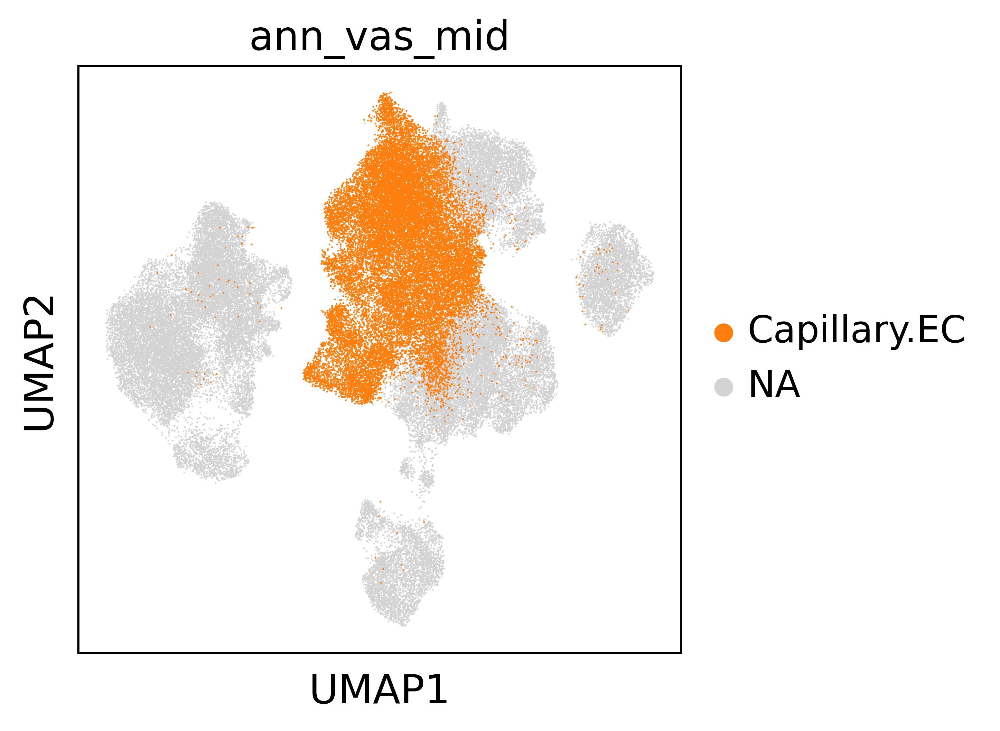

In [8]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["Capillary.EC"])

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


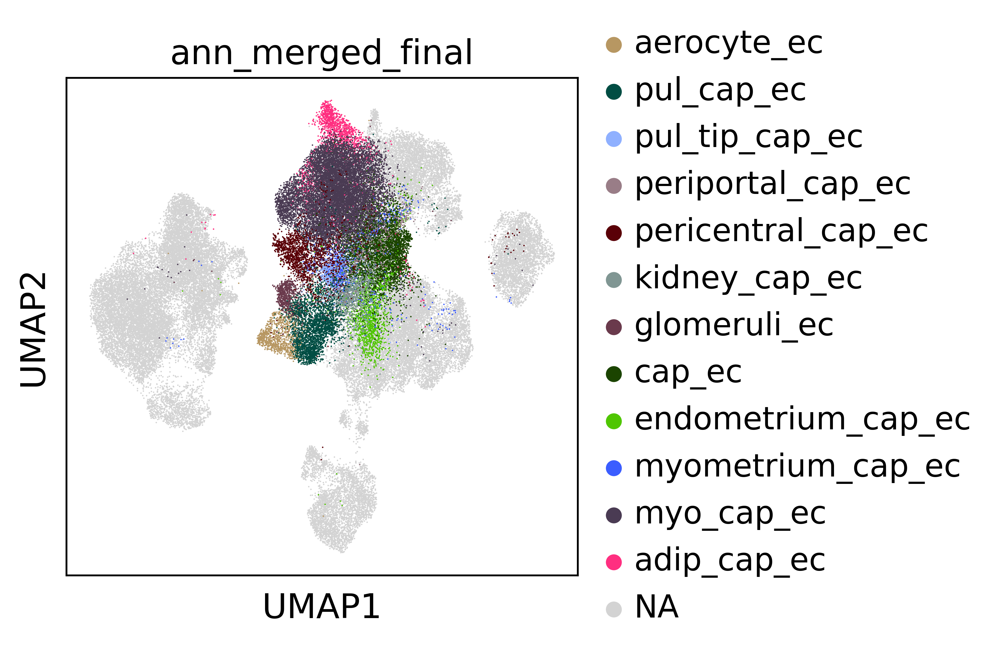

In [46]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"])

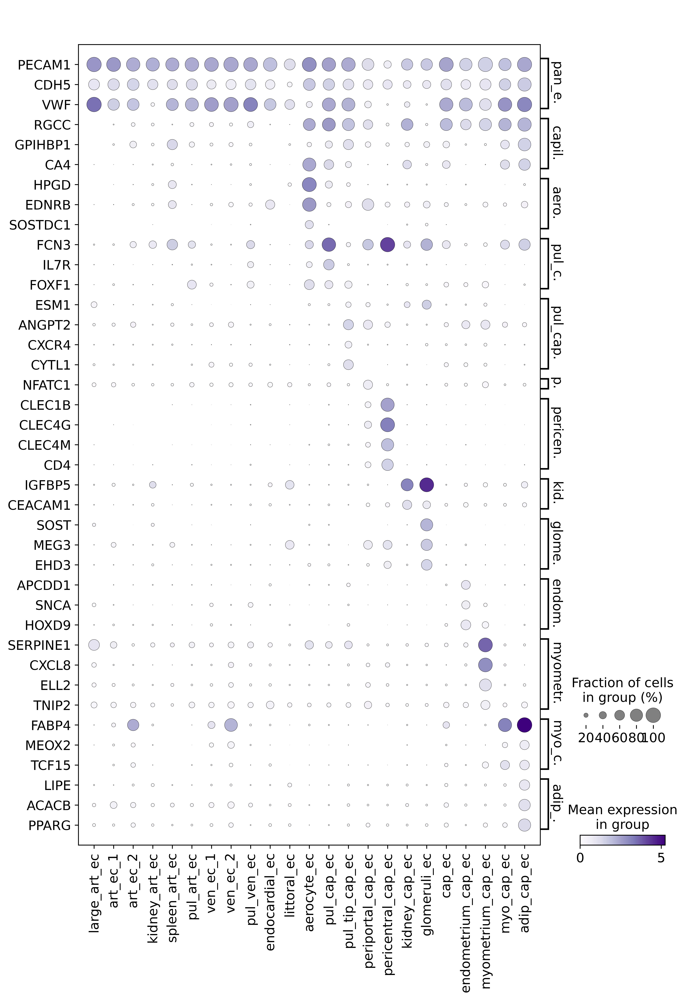

In [45]:
# sc.pl.umap(adata, color = "ann_merged_final", groups = ["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"])

cap_markers = {
    'pan_ec': ["PECAM1","CDH5","VWF"],
    'capillary_ec': ["RGCC","GPIHBP1","CA4"],
    'aerocyte_ec': ["HPGD","EDNRB","SOSTDC1"],
    'pul_cap_ec': ["FCN3","IL7R","FOXF1"],
    'pul_cap_tip_ec': ["ESM1","ANGPT2","CXCR4","CYTL1"],
    'periportal_cap_ec': ["NFATC1"],
    'pericentral_cap_ec': ["CLEC1B","CLEC4G","CLEC4M","CD4"],
    'kidney_cap_ec': ["IGFBP5","CEACAM1"],
    'glomeruli_ec': ["SOST","MEG3","EHD3"],
    'endometrum_cap_ec': ["APCDD1","SNCA","HOXD9"],
    'myometrium_cap_ec': ["SERPINE1","CXCL8","ELL2","TNIP2"],
    'myo_cap_ec': ["FABP4","MEOX2","TCF15"],
    'adip_cap_ec': ["LIPE","ACACB","PPARG"]
}

sc.pl.dotplot(adata_ec, cap_markers, "ann_merged_final", swap_axes = True, color_map = 'Purples')

In [37]:
df6 = log1p_enrichment_table.loc[["aerocyte_ec","pul_cap_ec","pul_tip_cap_ec","periportal_cap_ec","pericentral_cap_ec","kidney_cap_ec","glomeruli_ec","cap_ec","endometrium_cap_ec","myometrium_cap_ec","myo_cap_ec","adip_cap_ec"]]

In [38]:
df6

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
aerocyte_ec,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.220878,0.000000,0.008157,0.000000,0.000000,0.000000,0.032342,0.000000,0.000000,0.000000
pul_cap_ec,0.000000,0.000000,0.007464,0.009068,0.066199,0.041119,0.000000,0.783993,2.180409,0.005492,0.008236,0.000000,0.014644,0.013065,0.032650,0.017132,0.070165,0.017030
pul_tip_cap_ec,0.000000,0.150915,0.139673,0.049390,0.311286,0.000000,0.065967,0.389539,2.101088,0.285596,0.000000,0.000000,0.093845,0.161632,0.137651,0.000000,0.000000,0.567430
periportal_cap_ec,0.000000,0.000000,0.000000,0.084871,0.124957,0.185722,0.000000,3.451693,0.405095,0.052162,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.288208
pericentral_cap_ec,0.000000,0.000000,0.063464,0.010567,0.134235,0.000000,0.000000,3.515244,0.261969,0.019082,0.000000,0.000000,0.000000,0.022744,0.047246,0.000000,0.000000,0.009965
kidney_cap_ec,0.000000,0.000000,0.000000,0.321578,3.476545,0.222901,0.000000,0.471123,0.383072,0.283348,0.000000,0.000000,0.161694,0.000000,0.048177,0.186955,0.069584,0.065895
glomeruli_ec,0.000000,0.000000,0.000000,0.000000,3.633622,0.000000,0.045520,0.397396,0.178123,0.024775,0.000000,0.000000,0.000000,0.000000,0.338722,0.000000,0.000000,0.025746
cap_ec,0.170514,0.631173,0.054498,0.260199,0.267747,1.363575,0.177790,0.322239,0.316547,1.471002,0.029537,1.099543,2.710526,0.652677,0.058415,0.908187,1.345655,0.524009
endometrium_cap_ec,0.015525,0.368560,2.613782,0.022413,0.185942,0.067314,0.065637,0.111952,0.177367,0.095747,0.000000,0.268053,0.000000,0.042705,0.044857,0.000000,0.095743,1.911737


In [39]:
df7 = df6.transpose()
df7

ann_merged_final,aerocyte_ec,pul_cap_ec,pul_tip_cap_ec,periportal_cap_ec,pericentral_cap_ec,kidney_cap_ec,glomeruli_ec,cap_ec,endometrium_cap_ec,myometrium_cap_ec,myo_cap_ec,adip_cap_ec
organ_uni,,,,,,,,,,,,
adipose_tissue,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.170514,0.015525,0.049124,0.243227,2.958752
bladder,0.000000,0.000000,0.150915,0.000000,0.000000,0.000000,0.000000,0.631173,0.368560,0.540625,0.041086,0.041344
decidua,0.000000,0.007464,0.139673,0.000000,0.063464,0.000000,0.000000,0.054498,2.613782,0.198811,0.001836,0.000000
heart,0.000000,0.009068,0.049390,0.084871,0.010567,0.321578,0.000000,0.260199,0.022413,0.062821,1.511986,0.065995
kidney,0.000000,0.066199,0.311286,0.124957,0.134235,3.476545,3.633622,0.267747,0.185942,0.000000,0.006694,0.000000
large_intestine,0.000000,0.041119,0.000000,0.185722,0.000000,0.222901,0.000000,1.363575,0.067314,0.054507,0.064792,0.070037
large_vessels,0.000000,0.000000,0.065967,0.000000,0.000000,0.000000,0.045520,0.177790,0.065637,0.053141,0.005004,0.034730
liver,0.000000,0.783993,0.389539,3.451693,3.515244,0.471123,0.397396,0.322239,0.111952,0.174464,0.011612,0.000000
lung,2.220878,2.180409,2.101088,0.405095,0.261969,0.383072,0.178123,0.316547,0.177367,0.108177,0.009753,0.000000


In [ ]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (6,6)}):
    sns.heatmap(df7,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 1})
    

    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')

### cell cycle calculation

In [5]:
#run initial calculation

cell_cycle_genes = [x.strip() for x in open("/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Pdgfra_project/ScanpyScripts/new_cell_cycle3.txt")] 
#use new_cell_cycle3.txt for nuclei data.
#change path accordingly
cell_cycle_genes = pd.Series(cell_cycle_genes)
cell_cycle_genes = cell_cycle_genes.str.upper() #don't run this line if using mouse data (it applies upper case to all the genes)

s_genes = cell_cycle_genes[:17] #change to 17 for new_cell_cycle3
g2m_genes = cell_cycle_genes[17:] #change to 17 for new_cell_cycle3

s_genes = [x for x in s_genes if x in adata.var_names] #keep only genes present in adata
g2m_genes = [x for x in g2m_genes if x in adata.var_names] #keep only genes present in adata

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
scores = adata.obs[['S_score', 'G2M_score']]
phase = pd.Series('S', index=scores.index)
phase[scores.G2M_score > scores.S_score] = 'G2M'
phase[np.all(scores < 0.3, axis=1)] = 'G1' #threshold for G1. The closer to 0 (Scanpy's default) the least specific but more cells.
adata.obs['phase'] = phase

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [6]:
adata.obs["phase"].value_counts()

G1     74414
S         92
G2M       49
Name: phase, dtype: int64

In [7]:
pd.crosstab(adata.obs["ann_ec_final"],adata.obs["phase"])

phase,G1,G2M,S
ann_ec_final,,,
adip_cap_ec,1666,0,5
aerocyte_ec,971,0,1
aorta_ec,130,0,0
art_ec_1,950,0,0
art_ec_2,3697,0,3
cap_ec,4241,1,7
endocardial_ec,203,0,0
endometrium_cap_ec,1697,31,13
glomeruli_ec,633,0,1


In [8]:
#perform DGE analysis
sc.tl.rank_genes_groups(adata,groupby='phase',n_genes=50,method='t-test_overestim_var',corr_method='bonferroni')
sc.tl.dendrogram(adata,groupby='phase')

In [ ]:
#plot marker genes dotplot
#DGE should show a clear separation between G2M and S.
sc.pl.rank_genes_groups_dotplot(adata,n_genes=20)

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=20, groups = ["G2M","S"])
sc.pl.rank_genes_groups_dotplot(adata,n_genes=20, groups = ["G2M","S"], cmap = 'Greens')
sc.pl.rank_genes_groups_dotplot(adata,n_genes=20, groups = ["G2M","S"], cmap = 'Purples')

In [ ]:
#plot in UMAP
sc.pl.umap(adata,color="phase",groups=["G2M","S"],size=15, palette = ["green", "purple"]) #no need to plot G1 as all remaining cells are G1 anyway. 

In [17]:
df = pd.crosstab(adata.obs["ann_ec_final"],adata.obs["phase"])

In [18]:
df

phase,G1,G2M,S
ann_ec_final,,,
adip_cap_ec,1666,0,5
aerocyte_ec,971,0,1
aorta_ec,130,0,0
art_ec_1,950,0,0
art_ec_2,3697,0,3
cap_ec,4241,1,7
endocardial_ec,203,0,0
endometrium_cap_ec,1697,31,13
glomeruli_ec,633,0,1


In [19]:
df_proportions = df.div(df.sum(axis=1), axis=0)
df_proportions

phase,G1,G2M,S
ann_ec_final,,,
adip_cap_ec,0.997008,0.000000,0.002992
aerocyte_ec,0.998971,0.000000,0.001029
aorta_ec,1.000000,0.000000,0.000000
art_ec_1,1.000000,0.000000,0.000000
art_ec_2,0.999189,0.000000,0.000811
cap_ec,0.998117,0.000235,0.001647
endocardial_ec,1.000000,0.000000,0.000000
endometrium_cap_ec,0.974727,0.017806,0.007467
glomeruli_ec,0.998423,0.000000,0.001577


In [20]:
from matplotlib.pyplot import figure

In [ ]:
plt.rcParams["figure.figsize"] = (4,2)

df_proportions = df.div(df.sum(axis=1), axis=0)

column_to_drop = 'G1'
df_proportions = df_proportions.drop(columns=[column_to_drop])
df_proportions = df_proportions.loc[df_proportions.sum(axis=1) != 0]

df_proportions *= 100

colors = ['purple','green']

ax = df_proportions.plot(kind='bar', stacked=False, color=colors, width=0.8)

plt.xlabel('Categories')
plt.ylabel('Proportion of Total (%)')
plt.ylim(0, 2)

plt.show()

In [ ]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ["endometrium_cap_ec"])

### lymphatic_ec

In [ ]:
sc.pl.umap(adata, color = 'ann_vas_mid', groups = ["Lymphatic.EC"], frameon = True)

In [ ]:
sc.pl.umap(adata, color = "ann_merged_final", groups = ['lec_cap','blec','clec','flec','pfslec','vlec_down','vlec_up'])

art_markers = {
    'pan_ec': ["PECAM1","CDH5","PROX1","FLT4","TBX1"],
    'misc': ["LYVE1","CCL21","MMRN1","TFF3"],
    'LEC-cap': ["PDPN","RELN","LOX"],
    'clec_blec': ["ACKR4","PCDH15","ADAMTS1"],
    'flec': ["PLVAP"],
    'pfslec': ["MARCO","CD209","LGMN"],
    'vlec_up_down': ["GJA4","NEO1","CLDN11"],
}

sc.pl.dotplot(adata_ec, art_markers, "ann_merged_final", swap_axes = True, color_map = 'Oranges')

In [30]:
df6 = log1p_enrichment_table.loc[['lec_cap','blec','clec','flec','pfslec','vlec_down','vlec_up',]]

In [31]:
df6

organ_uni,adipose_tissue,bladder,decidua,heart,kidney,large_intestine,large_vessels,liver,lung,lymph_node,muscle,oesophagus,pancreas,small_intestine,spleen,thymus,trachea,uterus
ann_merged_final,,,,,,,,,,,,,,,,,,
lec_cap,0.232283,0.937376,1.728112,0.134176,0.000000,2.028881,0.249536,0.019223,1.253743,0.814118,0.086090,0.858636,0.069682,1.893140,0.000000,0.168185,0.401372,0.171199
blec,0.000000,0.121286,0.537630,0.000000,0.000000,0.287007,0.000000,0.000000,0.393458,2.615655,0.000000,0.631593,0.000000,0.747132,0.028786,0.694912,0.454659,0.000000
clec,0.111016,0.409931,0.117197,0.018723,0.000000,0.908464,0.226770,0.000000,0.603672,2.300575,0.000000,0.836065,0.267011,1.906540,0.000000,1.170216,0.263596,0.000000
flec,0.000000,0.000000,0.937502,0.000000,0.099967,0.279459,0.075598,0.000000,0.142732,2.705229,0.020952,0.000000,0.000000,0.184005,0.000000,0.064251,0.246190,0.043036
pfslec,0.000000,0.000000,0.456464,0.000000,0.000000,0.000000,0.387770,0.000000,0.084467,2.770579,0.000000,0.000000,0.000000,0.000000,0.000000,0.125249,0.000000,0.000000
vlec_down,0.139474,0.771338,0.112324,0.091999,0.000000,0.846800,0.281012,0.172997,0.596102,1.986701,0.759538,1.741371,0.000000,1.467624,0.000000,1.161129,0.325311,0.000000
vlec_up,0.438446,0.000000,0.000000,0.124750,0.000000,0.799542,0.000000,0.000000,0.650057,2.318113,0.077345,0.432184,0.620933,1.789639,0.000000,0.697209,0.722793,0.000000


In [32]:
df7 = df6.transpose()
df7

ann_merged_final,lec_cap,blec,clec,flec,pfslec,vlec_down,vlec_up
organ_uni,,,,,,,
adipose_tissue,0.232283,0.000000,0.111016,0.000000,0.000000,0.139474,0.438446
bladder,0.937376,0.121286,0.409931,0.000000,0.000000,0.771338,0.000000
decidua,1.728112,0.537630,0.117197,0.937502,0.456464,0.112324,0.000000
heart,0.134176,0.000000,0.018723,0.000000,0.000000,0.091999,0.124750
kidney,0.000000,0.000000,0.000000,0.099967,0.000000,0.000000,0.000000
large_intestine,2.028881,0.287007,0.908464,0.279459,0.000000,0.846800,0.799542
large_vessels,0.249536,0.000000,0.226770,0.075598,0.387770,0.281012,0.000000
liver,0.019223,0.000000,0.000000,0.000000,0.000000,0.172997,0.000000
lung,1.253743,0.393458,0.603672,0.142732,0.084467,0.596102,0.650057


In [ ]:
#organotypic art ec

from matplotlib.colors import ListedColormap

with rc_context({'figure.figsize': (6,6)}):
    sns.heatmap(df7,
                annot=False, fmt='g',
                square = True,
                cmap = 'RdPu',
                linewidths=0.5, linecolor='#424242',
                cbar_kws={"orientation": "vertical", "label": "log1p(obs/exp)", "shrink": 1})
    

    #plt.tick_params(axis='x', which='both', top=False, bottom=False, labeltop=False, labelbottom=False)
    ax = plt.gca()
    ax.spines['top'].set_linewidth(2)
    ax.spines['top'].set_edgecolor('black')
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['bottom'].set_edgecolor('black')
    ax.spines['left'].set_linewidth(2)
    ax.spines['left'].set_edgecolor('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['right'].set_edgecolor('black')
    #ax.set_xticklabels([])
    
    plt.show()
    #plt.savefig('./figures/enrichment_ec_av_enrichment.png')